# Convolutional Autoencoder

Sticking with the MNIST dataset, let's improve our autoencoder's performance using convolutional layers. Again, loading modules and the data.

In [187]:
%matplotlib inline

import numpy as np
import tensorflow as tf 
import matplotlib.pyplot as plt
import os 
import matplotlib.pyplot as plt
from matplotlib.image import imread
from scipy.misc import imsave
from scipy.misc import imresize
import numpy as np
from numpy import genfromtxt
import tensorflow as tf
from PIL import Image
import pickle
# from tensorflow_vgg import vgg16|
import collections
import time
import math

# Import GEI dataset 

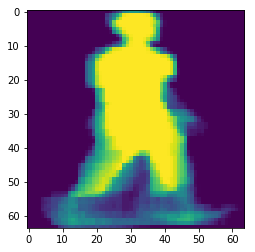

In [34]:
img = imread('{}'.format(os.path.join('OULP-C1V2_Pack/GEI/OULP-GEI-(224x224)-15f/Seq00/0000024', '0000024_55_GEI_15f.png')))
img = imresize(img, [64, 64], interp='nearest')
plt.imshow(img)
plt.show()

In [45]:
# Create Training Data
path = 'OULP-C1V2_Pack/GEI/OULP-GEI-(224x224)/Seq01'
Seq_15f_list = os.listdir(path)
Seq_15f_list.remove('.DS_Store')

Seq = []
for each_seq in Seq_15f_list:
    seq_path = os.path.join(path, each_seq)
    GEI = []
    for each_GEI in os.listdir(seq_path):
        img = imread('{}'.format(os.path.join(seq_path, each_GEI)))
        img = imresize(img, [64, 64], interp='nearest')
        GEI.append(img)
    Seq.append(np.array(GEI))
Seq = np.array(Seq)

In [46]:
with open('../gait_data/OULP_GEI/codes', 'wb') as f:
    np.save(f, Seq)

# Checkpoint 1

In [190]:
# gallery_15f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_15f_Seq00', mode='rb'))
# probe_15f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_15f_Seq01', mode='rb'))
gallery_full = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_full_Seq00', mode='rb'))
probe_full = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_full_Seq01', mode='rb'))

In [191]:
gallery_full = gallery_full/float(255)
probe_full = probe_full/float(255)

<br><br><br><br><br><br><br><br><br>

# Auto_Encoder 1: 55''-65''
### 先试full-full

In [192]:
# Train X
train_x = np.concatenate([gallery_full[:2800, 0], probe_full[:2800, 0]], axis=0)
train_x = np.reshape(train_x, [train_x.shape[0], train_x.shape[1], train_x.shape[2], 1])
# Train Y
train_y = np.concatenate([gallery_full[:2800, 1], probe_full[:2800, 1]], axis=0)
train_y = np.reshape(train_x, [train_x.shape[0], train_x.shape[1], train_x.shape[2], 1])
print('train_x', train_x.shape, 'train_y', train_y.shape)

# Val X
val_x = gallery_full[2800:, 0]
val_x = np.reshape(val_x, [val_x.shape[0], val_x.shape[1], val_x.shape[2], 1])
# Val Y
val_y = gallery_full[2800:, 1]
val_y = np.reshape(val_y, [val_y.shape[0], val_y.shape[1], val_y.shape[2], 1])
print('val_x', val_x.shape, 'val_y', val_y.shape)

# Test X
test_x = probe_full[2800:, 0]
test_x = np.reshape(test_x, [test_x.shape[0], test_x.shape[1], test_x.shape[2], 1])
# Test Y
test_y = probe_full[2800:, 1]
test_y = np.reshape(test_x, [test_x.shape[0], test_x.shape[1], test_x.shape[2], 1])
print('test_x', test_x.shape, 'test_y', test_y.shape)

train_x (5600, 64, 64, 1) train_y (5600, 64, 64, 1)
val_x (346, 64, 64, 1) val_y (346, 64, 64, 1)
test_x (346, 64, 64, 1) test_y (346, 64, 64, 1)


# Create Graph

In [194]:
def build_inputs_outputs():
    inputs_1 = tf.placeholder(tf.float32, (None, 64, 64, 1), name='inputs_1')
    targets_1 = tf.placeholder(tf.float32, (None, 64, 64, 1), name='targets_1')
    
    return inputs_1, targets_1

def conv_layer(inputs_, weights_name, conv_name, pool_name, bn_name, relu_name, add_bacth_norm=True, is_training=True, 
               set_stddev=0.03, out_dim=1, conv_kernsize=(2,2), conv_strides=(1,1), pool_size=(2,2), pool_strides=(2,2), 
               keep_prob=0.5):
    ### Encoder
    # e.g. out_dim: 8; kern_size: (3,3); pool_size: (2,2); strides: (2,2);
        
    # filter:[filter_height, filter_width, in_channels, out_channels]
    weight = tf.Variable(tf.truncated_normal([conv_kernsize[0],conv_kernsize[1],\
                         inputs_.get_shape().as_list()[3], out_dim], stddev=set_stddev),\
                         name=weights_name) 
    
    # Set bias
    bias = tf.Variable(tf.zeros(out_dim))
    
    # set strides of conv2d
    stride = [1, conv_strides[0], conv_strides[1], 1]
    
    # conv2d
    # input:[batch, in_height, in_width, in_channels]
    conv2d = tf.nn.bias_add(tf.nn.conv2d(inputs_, weight, stride, padding='SAME', name=conv_name), bias)
    
    # Now 28x28x
    if add_bacth_norm:
        conv2d = tf.layers.batch_normalization(conv2d, training=is_training, name=bn_name)
        
    # add activation function
    conv2d = tf.nn.relu(conv2d, name=relu_name)
    
    # add Max pooling
    conv2d_maxpool = tf.nn.max_pool(conv2d, [1,pool_size[0],pool_size[1],1],\
                                    [1,pool_strides[0],pool_strides[1],1], padding='SAME', name=pool_name)
                    
    conv2d_maxpool = tf.layers.dropout(conv2d_maxpool, rate=keep_prob)

    return conv2d_maxpool

#     # Now 14x14x16
#     conv2 = tf.layers.conv2d(maxpool1, 8, (3,3), padding='same', activation=tf.nn.relu)
#     # Now 14x14x8
#     maxpool2 = tf.layers.max_pooling2d(conv2, (2,2), (2,2), padding='same')
#     # Now 7x7x8
#     conv3 = tf.layers.conv2d(maxpool2, 8, (3,3), padding='same', activation=tf.nn.relu)
#     # Now 7x7x8
#     encoded = tf.layers.max_pooling2d(conv3, (2,2), (2,2), padding='same')
#     # Now 4x4x8

def deconv_layer(encoded, up_name, weights_name, de_conv_name, bn_name, relu_name, add_batch_norm=True, is_training=True, 
                 set_stddev=0.03, up_size=[(2,2),(4,4),(5,5),(6,6)], out_dim=1, conv_kernsize=(2,2), conv_strides=(1,1), keep_prob=0.5):
    ### Decoder
    upsample = tf.image.resize_nearest_neighbor(encoded, up_size, name=up_name) # up_size: e.g.(7,7)
    
    # set weight (filter)
    weight = tf.Variable(tf.truncated_normal([conv_kernsize[0],conv_kernsize[1],\
                         upsample.get_shape().as_list()[3], out_dim], stddev=set_stddev),\
                         name=weights_name)
    
    # set bias
    bias = tf.Variable(tf.zeros(out_dim))
    
    # set strides of conv2d
    stride = [1, conv_strides[0], conv_strides[1], 1]
    
    # conv2d
    conv2d = tf.nn.bias_add(tf.nn.conv2d(upsample, weight, stride, padding='SAME', name=de_conv_name),\
                   bias)
    
    if add_batch_norm:
        conv2d = tf.layers.batch_normalization(conv2d, training=is_training, name=bn_name)
    
    conv2d = tf.nn.relu(conv2d, name=relu_name)
    
    conv2d = tf.layers.dropout(conv2d, rate=keep_prob)
    
    return conv2d

#     # Now 7x7x8
#     upsample2 = tf.image.resize_nearest_neighbor(conv4, (14,14))
#     # Now 14x14x8
#     conv5 = tf.layers.conv2d(upsample2, 8, (3,3), padding='same', activation=tf.nn.relu)
#     # Now 14x14x8
#     upsample3 = tf.image.resize_nearest_neighbor(conv5, (28,28))
#     # Now 28x28x8
#     conv6 = tf.layers.conv2d(upsample3, 16, (3,3), padding='same', activation=tf.nn.relu)
#     # Now 28x28x16

def output_layer(conv2d, weights_name, logits_name, bn_name, decoded_name, add_batch_norm=True, is_training=True, 
                 set_stddev=0.03, out_dim=1, conv_kernsize=(3,3), conv_strides=(1,1)):
    # set weight (filter)
    weight = tf.Variable(tf.truncated_normal([conv_kernsize[0],conv_kernsize[1],\
                         conv2d.get_shape().as_list()[3], out_dim], stddev=set_stddev),\
                         name=weights_name)
    
    # set bias
    bias = tf.Variable(tf.zeros(out_dim))
    
    # set strides of conv2d
    stride = [1, conv_strides[0], conv_strides[1], 1]
    
    # conv2d
    logits = tf.nn.bias_add(tf.nn.conv2d(conv2d, weight, stride, padding='SAME', name=logits_name),\
                   bias)
    
    if add_batch_norm:
        conv2d = tf.layers.batch_normalization(conv2d, training=is_training, name=bn_name)
    #Now 28x28x1
    decoded = tf.nn.sigmoid(logits, name=decoded_name)
    
    return logits, decoded

In [195]:
def build_graph(kern_size, std, conv_strides, pool_size, pool_strides, de_kern_size, 
                de_conv_strides, out_kern_size, out_strides, up_size=[(16,16), (32,32), (64,64)], set_is_training=True):
    
    # reset graph
    tf.reset_default_graph()
    
    with tf.name_scope('inputs_targets'):
        inputs_1, targets_1 = build_inputs_outputs()
    
    keep_p = tf.placeholder(tf.float32, name="keep_prob")
    
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    
    with tf.name_scope('conv_layers'):
        
        maxpool_1 = conv_layer(inputs_1, 'conv_weights_1', 'conv_1', 'pool_1', 'bn_1', 'relu_1', add_bacth_norm=False, 
                               is_training=set_is_training, set_stddev=std, out_dim=24, conv_kernsize=kern_size, conv_strides=conv_strides, 
                               pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        
        maxpool_2 = conv_layer(maxpool_1, 'conv_weights_2', 'conv_2', 'pool_2', 'bn_2', 'relu_2', add_bacth_norm=True, 
                               is_training=set_is_training, set_stddev=std, out_dim=12, conv_kernsize=kern_size, conv_strides=conv_strides, 
                               pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        
        maxpool_3 = conv_layer(maxpool_2, 'conv_weights_3', 'conv_3', 'pool_3', 'bn_3', 'relu_3', add_bacth_norm=True, 
                               is_training=set_is_training, set_stddev=std, out_dim=8, conv_kernsize=kern_size, conv_strides=conv_strides, 
                               pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        
        maxpool_4 = conv_layer(maxpool_3, 'conv_weights_4', 'conv_4', 'pool_4', 'bn_4', 'relu_4', add_bacth_norm=True, 
                               is_training=set_is_training, set_stddev=std, out_dim=8, conv_kernsize=kern_size, conv_strides=conv_strides, 
                               pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        # Now 4x4x8 as hidden layer
        
    with tf.name_scope('deconv_layers'):
        
        deconv_1 = deconv_layer(maxpool_4, 'up_1', 'deconv_weights_1', 'deconv_1', 'de_bn_1', 'de_relu_1', add_batch_norm=True, 
                              is_training=set_is_training, set_stddev=std, up_size=up_size[0], out_dim=8, conv_kernsize=de_kern_size,
                              conv_strides=de_conv_strides, keep_prob=keep_p)
        
        deconv_2 = deconv_layer(deconv_1, 'up_2', 'deconv_weights_2', 'deconv_2', 'de_bn_2', 'de_relu_2', add_batch_norm=True, 
                              is_training=set_is_training, set_stddev=std, up_size=up_size[1], out_dim=8, conv_kernsize=de_kern_size,
                              conv_strides=de_conv_strides, keep_prob=keep_p)
        
        deconv_3 = deconv_layer(deconv_2, 'up_3', 'deconv_weights_3', 'deconv_3', 'de_bn_3', 'de_relu_3', add_batch_norm=True, 
                              is_training=set_is_training, set_stddev=std, up_size=up_size[2], out_dim=12, conv_kernsize=de_kern_size,
                              conv_strides=de_conv_strides, keep_prob=keep_p)
        
        deconv_4 = deconv_layer(deconv_3, 'up_4', 'deconv_weights_4', 'deconv_4', 'de_bn_4', 'de_relu_4', add_batch_norm=True, 
                              is_training=set_is_training, set_stddev=std, up_size=up_size[3], out_dim=24, conv_kernsize=de_kern_size,
                              conv_strides=de_conv_strides, keep_prob=keep_p)
        
    with tf.name_scope('output_layer'):
       
        logits, decoded = output_layer(deconv_4, 'output_weights', 'logits', 'bn', 'decoded', add_batch_norm=True, is_training=set_is_training, 
                                       set_stddev=std, out_dim=1, conv_kernsize=out_kern_size, conv_strides=out_strides)
        
    loss = tf.nn.sigmoid_cross_entropy_with_logits(labels=targets_1, logits=logits, name='loss')
    cost = tf.reduce_mean(loss, name='cost')
    opt = tf.train.AdamOptimizer(learning_rate).minimize(cost)
    
    with tf.name_scope('saver'):
        saver = tf.train.Saver()
        
#     merged = tf.summary.merge_all()
    
    export_nodes = ['inputs_1', 'targets_1', 'maxpool_1', 'maxpool_2', 'maxpool_3', 'maxpool_4', 'deconv_1', 'deconv_2', 
                    'deconv_3', 'deconv_3', 'logits', 'decoded', 'loss', 'cost', 'opt', 'saver', 'learning_rate', 'keep_p']
    
    Graph = collections.namedtuple('Graph', export_nodes)
    local_dict = locals()
    graph = Graph(*[local_dict[each] for each in export_nodes])
    
    return graph

In [196]:
def get_batches(data, target, batch_size):
    n_batches = len(data)//batch_size
    data = data[:batch_size * n_batches]
    target = target[:batch_size * n_batches]
    for ii in range(0, batch_size*n_batches, batch_size):
        data_batch = data[ii:ii + batch_size]
        target_batch = target[ii:ii + batch_size]
        
        yield data_batch, target_batch
        
        
def cal_accuracy(decoded, target):
    error = abs(decoded - target)
    Acc = (np.sum(error <= 0.07)/(decoded.shape[0]*decoded.shape[1]*decoded.shape[2]*decoded.shape[3]))*100
    
    return Acc

In [197]:
error = np.random.rand(10,5,5,1)
np.sum(error >= 0.9)/100

0.20000000000000001

In [198]:
def train(model, epochs, save_string):

    with tf.Session(config=tf.ConfigProto(log_device_placement=True)) as sess:
        sess.run(tf.global_variables_initializer())
        
        iteration = 1
        mean_val_loss = 0
        mean_val_acc = 0
        count_loss_not_decrease_epochs = 0
        count_acc_not_decrease_epochs = 0
        Last_val_loss = 0
        Last_val_acc = 0
        
        
        for e in range(epochs):
            for train_batch, target_batch in get_batches(train_x, train_y, batch_size):
                    
                start = time.time()
                
                feed_1 = {
                        model.inputs_1: train_batch, 
                        model.targets_1: target_batch,
                        model.keep_p: 0.6,
                        model.learning_rate: lr
                        }

                train_loss, _, decoded_img = sess.run([model.cost, model.opt, model.decoded], feed_dict=feed_1)
                
                train_acc = cal_accuracy(decoded_img, target_batch)
                
                if iteration%25==0:
                    end = time.time()
#                     acc = calculate_accuracy(sess, pred, target_batch, sq_length)
                    print("Epoch: {}/{},".format(e+1, epochs),' '
                          "Iteration: {},".format(iteration),' '
                          "Train loss: {:.3f},".format(train_loss),'      '
                          "{:.1f}s /batch.".format((end-start)/5),' '
                          "Train Accuracy: %{:.3f}".format(train_acc))

                ##############################################################
                ######################## VALIDATION ##########################
                ##############################################################
                
                if iteration%75==0:
#                     training = True
                    validation_loss = []
                    validation_acc = []
                    
                    if batch_size >= len(val_x):
                        val_batch_size = len(val_x)
                    else: 
                        val_batch_size = batch_size
                        

                    for ii, (val_batch, val_target_batch) in enumerate(get_batches(val_x, val_y, val_batch_size)):
#                         print(ii, len(val_x)//val_batch_size)
                        feed_2 = {
                                model.inputs_1: val_batch,
                                model.targets_1: val_target_batch,
                                model.keep_p: 1
                                }
                        
                        val_loss, val_decoded_img, max_pool_3 = sess.run([model.cost, model.decoded, model.maxpool_3], 
                                                                          feed_dict=feed_2)

                        val_acc = cal_accuracy(val_decoded_img, val_target_batch)
                        
                        validation_loss.append(val_loss)
                        validation_acc.append(val_acc)
                    
                    Last_val_loss = mean_val_loss
                    Last_val_acc = mean_val_acc
                    mean_val_loss = np.mean(np.array(validation_loss))
                    mean_val_acc = np.mean(np.array(validation_acc))
                    
                    print()
                    print("Validation loss: {:.3f},".format(mean_val_loss),' '
                          "Validation accuracy: {:.3f},".format(mean_val_acc),' '
                          "maxpool_3.shape: {}.".format(max_pool_3[0].shape))
                    print()
                        
                ####### plot #######
                if iteration%600==0:
                    
                    feed_3 = {
                            model.inputs_1: val_x[:10],
                            model.keep_p: 1
                            }
                    
                    fig, axes = plt.subplots(nrows=2, ncols=10, sharex=True, sharey=True, figsize=(20,4))
                    in_imgs = val_y[:10]
                    reconstructed = sess.run(model.decoded, feed_dict=feed_3)

                    # plot out
                    for images, row in zip([in_imgs, reconstructed], axes):
                        for img, ax in zip(images, row):
                            ax.imshow(img.reshape((64, 64)), cmap='Greys_r')
                            ax.get_xaxis().set_visible(False)
                            ax.get_yaxis().set_visible(False)


                    fig.tight_layout(pad=0.1)
                            
                    
                    
                    
                    
                iteration += 1
                
#             # Early stopping  
#             if mean_val_Acc - Last_val_Acc <= -0.3:
#                 count_Acc_not_increase_epochs += 1
#             if Last_val_loss - mean_val_loss <= -0.01:
#                 count_loss_not_decrease_epochs += 1
                
#             if mean_val_Acc - Last_val_Acc <= -2:
#                 break
#             if count_Acc_not_increase_epochs >= 10:
#                 break
#             if count_loss_not_decrease_epochs >= 10:
#                 break
                
        model.saver.save(sess, r"{}".format(save_string))

mkdir: cannot create directory ‘checkpoints_view_invariant’: File exists
Epoch: 1/1000,  Iteration: 25,  Train loss: 0.312,       0.0s /batch.  Train Accuracy: %60.106
Epoch: 1/1000,  Iteration: 50,  Train loss: 0.275,       0.0s /batch.  Train Accuracy: %75.613
Epoch: 2/1000,  Iteration: 75,  Train loss: 0.261,       0.0s /batch.  Train Accuracy: %80.597

Validation loss: 0.259,  Validation accuracy: 75.860,  maxpool_3.shape: (8, 8, 8).

Epoch: 2/1000,  Iteration: 100,  Train loss: 0.246,       0.0s /batch.  Train Accuracy: %82.882
Epoch: 2/1000,  Iteration: 125,  Train loss: 0.240,       0.0s /batch.  Train Accuracy: %84.486
Epoch: 3/1000,  Iteration: 150,  Train loss: 0.242,       0.0s /batch.  Train Accuracy: %86.639

Validation loss: 0.244,  Validation accuracy: 79.698,  maxpool_3.shape: (8, 8, 8).

Epoch: 3/1000,  Iteration: 175,  Train loss: 0.239,       0.0s /batch.  Train Accuracy: %87.084
Epoch: 3/1000,  Iteration: 200,  Train loss: 0.237,       0.0s /batch.  Train Accuracy: 

Epoch: 24/1000,  Iteration: 1675,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %95.182
Epoch: 25/1000,  Iteration: 1700,  Train loss: 0.220,       0.0s /batch.  Train Accuracy: %95.275
Epoch: 25/1000,  Iteration: 1725,  Train loss: 0.233,       0.0s /batch.  Train Accuracy: %95.603

Validation loss: 0.238,  Validation accuracy: 84.583,  maxpool_3.shape: (8, 8, 8).

Epoch: 25/1000,  Iteration: 1750,  Train loss: 0.231,       0.0s /batch.  Train Accuracy: %95.128
Epoch: 26/1000,  Iteration: 1775,  Train loss: 0.225,       0.0s /batch.  Train Accuracy: %95.090
Epoch: 26/1000,  Iteration: 1800,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %95.692

Validation loss: 0.240,  Validation accuracy: 83.969,  maxpool_3.shape: (8, 8, 8).

Epoch: 27/1000,  Iteration: 1825,  Train loss: 0.229,       0.0s /batch.  Train Accuracy: %95.462
Epoch: 27/1000,  Iteration: 1850,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %95.176
Epoch: 27/1000,  Iteration: 1875,  Train loss:

Epoch: 48/1000,  Iteration: 3325,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %96.399
Epoch: 48/1000,  Iteration: 3350,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %96.356
Epoch: 49/1000,  Iteration: 3375,  Train loss: 0.229,       0.0s /batch.  Train Accuracy: %96.586

Validation loss: 0.244,  Validation accuracy: 83.998,  maxpool_3.shape: (8, 8, 8).

Epoch: 49/1000,  Iteration: 3400,  Train loss: 0.232,       0.0s /batch.  Train Accuracy: %96.523
Epoch: 49/1000,  Iteration: 3425,  Train loss: 0.225,       0.0s /batch.  Train Accuracy: %96.402
Epoch: 50/1000,  Iteration: 3450,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %96.357

Validation loss: 0.234,  Validation accuracy: 86.562,  maxpool_3.shape: (8, 8, 8).

Epoch: 50/1000,  Iteration: 3475,  Train loss: 0.232,       0.0s /batch.  Train Accuracy: %96.745
Epoch: 50/1000,  Iteration: 3500,  Train loss: 0.229,       0.0s /batch.  Train Accuracy: %96.365
Epoch: 51/1000,  Iteration: 3525,  Train loss:

Epoch: 72/1000,  Iteration: 4975,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %96.942
Epoch: 72/1000,  Iteration: 5000,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %96.826
Epoch: 72/1000,  Iteration: 5025,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %96.961

Validation loss: 0.234,  Validation accuracy: 86.743,  maxpool_3.shape: (8, 8, 8).

Epoch: 73/1000,  Iteration: 5050,  Train loss: 0.225,       0.0s /batch.  Train Accuracy: %97.329
Epoch: 73/1000,  Iteration: 5075,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %97.012
Epoch: 73/1000,  Iteration: 5100,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %96.818

Validation loss: 0.233,  Validation accuracy: 86.721,  maxpool_3.shape: (8, 8, 8).

Epoch: 74/1000,  Iteration: 5125,  Train loss: 0.228,       0.0s /batch.  Train Accuracy: %97.110
Epoch: 74/1000,  Iteration: 5150,  Train loss: 0.231,       0.0s /batch.  Train Accuracy: %97.035
Epoch: 74/1000,  Iteration: 5175,  Train loss:

Epoch: 95/1000,  Iteration: 6625,  Train loss: 0.231,       0.0s /batch.  Train Accuracy: %97.432
Epoch: 95/1000,  Iteration: 6650,  Train loss: 0.228,       0.0s /batch.  Train Accuracy: %97.226
Epoch: 96/1000,  Iteration: 6675,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %96.931

Validation loss: 0.232,  Validation accuracy: 86.995,  maxpool_3.shape: (8, 8, 8).

Epoch: 96/1000,  Iteration: 6700,  Train loss: 0.225,       0.0s /batch.  Train Accuracy: %97.426
Epoch: 97/1000,  Iteration: 6725,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %97.314
Epoch: 97/1000,  Iteration: 6750,  Train loss: 0.220,       0.0s /batch.  Train Accuracy: %97.256

Validation loss: 0.238,  Validation accuracy: 85.365,  maxpool_3.shape: (8, 8, 8).

Epoch: 97/1000,  Iteration: 6775,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %97.356
Epoch: 98/1000,  Iteration: 6800,  Train loss: 0.225,       0.0s /batch.  Train Accuracy: %97.591
Epoch: 98/1000,  Iteration: 6825,  Train loss:

Epoch: 118/1000,  Iteration: 8250,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %97.251

Validation loss: 0.233,  Validation accuracy: 87.022,  maxpool_3.shape: (8, 8, 8).

Epoch: 119/1000,  Iteration: 8275,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %97.507
Epoch: 119/1000,  Iteration: 8300,  Train loss: 0.230,       0.0s /batch.  Train Accuracy: %97.350
Epoch: 119/1000,  Iteration: 8325,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %97.544

Validation loss: 0.237,  Validation accuracy: 85.872,  maxpool_3.shape: (8, 8, 8).

Epoch: 120/1000,  Iteration: 8350,  Train loss: 0.217,       0.0s /batch.  Train Accuracy: %97.498
Epoch: 120/1000,  Iteration: 8375,  Train loss: 0.231,       0.0s /batch.  Train Accuracy: %97.622
Epoch: 120/1000,  Iteration: 8400,  Train loss: 0.228,       0.0s /batch.  Train Accuracy: %97.442

Validation loss: 0.234,  Validation accuracy: 86.597,  maxpool_3.shape: (8, 8, 8).

Epoch: 121/1000,  Iteration: 8425,  Train loss: 0.22

Epoch: 141/1000,  Iteration: 9850,  Train loss: 0.225,       0.0s /batch.  Train Accuracy: %97.658
Epoch: 142/1000,  Iteration: 9875,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %97.677
Epoch: 142/1000,  Iteration: 9900,  Train loss: 0.220,       0.0s /batch.  Train Accuracy: %97.642

Validation loss: 0.239,  Validation accuracy: 85.598,  maxpool_3.shape: (8, 8, 8).

Epoch: 142/1000,  Iteration: 9925,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %97.602
Epoch: 143/1000,  Iteration: 9950,  Train loss: 0.225,       0.0s /batch.  Train Accuracy: %97.867
Epoch: 143/1000,  Iteration: 9975,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %97.581

Validation loss: 0.234,  Validation accuracy: 86.769,  maxpool_3.shape: (8, 8, 8).

Epoch: 143/1000,  Iteration: 10000,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %97.412
Epoch: 144/1000,  Iteration: 10025,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %97.602
Epoch: 144/1000,  Iteration: 10050, 

/usr/home/rez/anaconda3/envs/tensorflow/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Epoch: 151/1000,  Iteration: 10525,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %97.369
Epoch: 151/1000,  Iteration: 10550,  Train loss: 0.225,       0.0s /batch.  Train Accuracy: %97.682
Epoch: 152/1000,  Iteration: 10575,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %97.732

Validation loss: 0.234,  Validation accuracy: 86.478,  maxpool_3.shape: (8, 8, 8).

Epoch: 152/1000,  Iteration: 10600,  Train loss: 0.220,       0.0s /batch.  Train Accuracy: %97.722
Epoch: 152/1000,  Iteration: 10625,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %97.636
Epoch: 153/1000,  Iteration: 10650,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %97.905

Validation loss: 0.233,  Validation accuracy: 86.218,  maxpool_3.shape: (8, 8, 8).

Epoch: 153/1000,  Iteration: 10675,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %97.619
Epoch: 153/1000,  Iteration: 10700,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %97.436
Epoch: 154/1000,  Iteration: 1

Epoch: 174/1000,  Iteration: 12150,  Train loss: 0.230,       0.0s /batch.  Train Accuracy: %97.618

Validation loss: 0.235,  Validation accuracy: 86.113,  maxpool_3.shape: (8, 8, 8).

Epoch: 174/1000,  Iteration: 12175,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %97.784
Epoch: 175/1000,  Iteration: 12200,  Train loss: 0.217,       0.0s /batch.  Train Accuracy: %97.762
Epoch: 175/1000,  Iteration: 12225,  Train loss: 0.230,       0.0s /batch.  Train Accuracy: %97.906

Validation loss: 0.237,  Validation accuracy: 85.396,  maxpool_3.shape: (8, 8, 8).

Epoch: 175/1000,  Iteration: 12250,  Train loss: 0.228,       0.0s /batch.  Train Accuracy: %97.742
Epoch: 176/1000,  Iteration: 12275,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %97.435
Epoch: 176/1000,  Iteration: 12300,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %97.750

Validation loss: 0.241,  Validation accuracy: 85.092,  maxpool_3.shape: (8, 8, 8).

Epoch: 177/1000,  Iteration: 12325,  Train lo

Epoch: 197/1000,  Iteration: 13750,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %97.905
Epoch: 197/1000,  Iteration: 13775,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %97.686
Epoch: 198/1000,  Iteration: 13800,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.043

Validation loss: 0.233,  Validation accuracy: 86.343,  maxpool_3.shape: (8, 8, 8).

Epoch: 198/1000,  Iteration: 13825,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %97.822
Epoch: 198/1000,  Iteration: 13850,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %97.645
Epoch: 199/1000,  Iteration: 13875,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %97.765

Validation loss: 0.243,  Validation accuracy: 84.743,  maxpool_3.shape: (8, 8, 8).

Epoch: 199/1000,  Iteration: 13900,  Train loss: 0.230,       0.0s /batch.  Train Accuracy: %97.726
Epoch: 199/1000,  Iteration: 13925,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %97.895
Epoch: 200/1000,  Iteration: 1

Epoch: 220/1000,  Iteration: 15375,  Train loss: 0.230,       0.0s /batch.  Train Accuracy: %98.067

Validation loss: 0.236,  Validation accuracy: 85.493,  maxpool_3.shape: (8, 8, 8).

Epoch: 220/1000,  Iteration: 15400,  Train loss: 0.228,       0.0s /batch.  Train Accuracy: %97.919
Epoch: 221/1000,  Iteration: 15425,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %97.545
Epoch: 221/1000,  Iteration: 15450,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %97.803

Validation loss: 0.241,  Validation accuracy: 85.058,  maxpool_3.shape: (8, 8, 8).

Epoch: 222/1000,  Iteration: 15475,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %97.946
Epoch: 222/1000,  Iteration: 15500,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %97.971
Epoch: 222/1000,  Iteration: 15525,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %97.796

Validation loss: 0.235,  Validation accuracy: 86.641,  maxpool_3.shape: (8, 8, 8).

Epoch: 223/1000,  Iteration: 15550,  Train lo

Epoch: 243/1000,  Iteration: 16975,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %97.960
Epoch: 243/1000,  Iteration: 17000,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %97.722
Epoch: 244/1000,  Iteration: 17025,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %97.989

Validation loss: 0.242,  Validation accuracy: 84.843,  maxpool_3.shape: (8, 8, 8).

Epoch: 244/1000,  Iteration: 17050,  Train loss: 0.230,       0.0s /batch.  Train Accuracy: %97.817
Epoch: 244/1000,  Iteration: 17075,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %98.050
Epoch: 245/1000,  Iteration: 17100,  Train loss: 0.217,       0.0s /batch.  Train Accuracy: %97.928

Validation loss: 0.236,  Validation accuracy: 86.497,  maxpool_3.shape: (8, 8, 8).

Epoch: 245/1000,  Iteration: 17125,  Train loss: 0.230,       0.0s /batch.  Train Accuracy: %98.136
Epoch: 245/1000,  Iteration: 17150,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %97.983
Epoch: 246/1000,  Iteration: 1

Epoch: 266/1000,  Iteration: 18600,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %97.907

Validation loss: 0.241,  Validation accuracy: 85.012,  maxpool_3.shape: (8, 8, 8).

Epoch: 267/1000,  Iteration: 18625,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.025
Epoch: 267/1000,  Iteration: 18650,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %98.098
Epoch: 267/1000,  Iteration: 18675,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %97.938

Validation loss: 0.235,  Validation accuracy: 86.643,  maxpool_3.shape: (8, 8, 8).

Epoch: 268/1000,  Iteration: 18700,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.235
Epoch: 268/1000,  Iteration: 18725,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.013
Epoch: 268/1000,  Iteration: 18750,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %97.784

Validation loss: 0.234,  Validation accuracy: 87.247,  maxpool_3.shape: (8, 8, 8).

Epoch: 269/1000,  Iteration: 18775,  Train lo

Epoch: 289/1000,  Iteration: 20200,  Train loss: 0.230,       0.0s /batch.  Train Accuracy: %97.895
Epoch: 289/1000,  Iteration: 20225,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %98.105
Epoch: 290/1000,  Iteration: 20250,  Train loss: 0.217,       0.0s /batch.  Train Accuracy: %98.011

Validation loss: 0.236,  Validation accuracy: 86.505,  maxpool_3.shape: (8, 8, 8).

Epoch: 290/1000,  Iteration: 20275,  Train loss: 0.230,       0.0s /batch.  Train Accuracy: %98.250
Epoch: 290/1000,  Iteration: 20300,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %98.033
Epoch: 291/1000,  Iteration: 20325,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %97.698

Validation loss: 0.233,  Validation accuracy: 87.266,  maxpool_3.shape: (8, 8, 8).

Epoch: 291/1000,  Iteration: 20350,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %97.990
Epoch: 292/1000,  Iteration: 20375,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.078
Epoch: 292/1000,  Iteration: 2

Epoch: 312/1000,  Iteration: 21825,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %98.049

Validation loss: 0.235,  Validation accuracy: 86.625,  maxpool_3.shape: (8, 8, 8).

Epoch: 313/1000,  Iteration: 21850,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.340
Epoch: 313/1000,  Iteration: 21875,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.053
Epoch: 313/1000,  Iteration: 21900,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %97.840

Validation loss: 0.233,  Validation accuracy: 87.279,  maxpool_3.shape: (8, 8, 8).

Epoch: 314/1000,  Iteration: 21925,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %98.130
Epoch: 314/1000,  Iteration: 21950,  Train loss: 0.230,       0.0s /batch.  Train Accuracy: %97.916
Epoch: 314/1000,  Iteration: 21975,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.185

Validation loss: 0.237,  Validation accuracy: 86.257,  maxpool_3.shape: (8, 8, 8).

Epoch: 315/1000,  Iteration: 22000,  Train lo

Epoch: 335/1000,  Iteration: 23425,  Train loss: 0.230,       0.0s /batch.  Train Accuracy: %98.350
Epoch: 335/1000,  Iteration: 23450,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %98.074
Epoch: 336/1000,  Iteration: 23475,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %97.796

Validation loss: 0.233,  Validation accuracy: 87.328,  maxpool_3.shape: (8, 8, 8).

Epoch: 336/1000,  Iteration: 23500,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.076
Epoch: 337/1000,  Iteration: 23525,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.184
Epoch: 337/1000,  Iteration: 23550,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %98.226

Validation loss: 0.237,  Validation accuracy: 86.305,  maxpool_3.shape: (8, 8, 8).

Epoch: 337/1000,  Iteration: 23575,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %98.076
Epoch: 338/1000,  Iteration: 23600,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.370
Epoch: 338/1000,  Iteration: 2

Epoch: 358/1000,  Iteration: 25050,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %97.893

Validation loss: 0.233,  Validation accuracy: 87.319,  maxpool_3.shape: (8, 8, 8).

Epoch: 359/1000,  Iteration: 25075,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.176
Epoch: 359/1000,  Iteration: 25100,  Train loss: 0.230,       0.0s /batch.  Train Accuracy: %98.035
Epoch: 359/1000,  Iteration: 25125,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.249

Validation loss: 0.237,  Validation accuracy: 86.374,  maxpool_3.shape: (8, 8, 8).

Epoch: 360/1000,  Iteration: 25150,  Train loss: 0.217,       0.0s /batch.  Train Accuracy: %98.099
Epoch: 360/1000,  Iteration: 25175,  Train loss: 0.230,       0.0s /batch.  Train Accuracy: %98.370
Epoch: 360/1000,  Iteration: 25200,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %98.090

Validation loss: 0.236,  Validation accuracy: 86.561,  maxpool_3.shape: (8, 8, 8).

Epoch: 361/1000,  Iteration: 25225,  Train lo

Epoch: 381/1000,  Iteration: 26650,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.166
Epoch: 382/1000,  Iteration: 26675,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.230
Epoch: 382/1000,  Iteration: 26700,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %98.263

Validation loss: 0.237,  Validation accuracy: 86.414,  maxpool_3.shape: (8, 8, 8).

Epoch: 382/1000,  Iteration: 26725,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %98.136
Epoch: 383/1000,  Iteration: 26750,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.417
Epoch: 383/1000,  Iteration: 26775,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.125

Validation loss: 0.236,  Validation accuracy: 86.640,  maxpool_3.shape: (8, 8, 8).

Epoch: 383/1000,  Iteration: 26800,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %97.948
Epoch: 384/1000,  Iteration: 26825,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %98.136
Epoch: 384/1000,  Iteration: 2

Epoch: 404/1000,  Iteration: 28275,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.289

Validation loss: 0.237,  Validation accuracy: 86.452,  maxpool_3.shape: (8, 8, 8).

Epoch: 405/1000,  Iteration: 28300,  Train loss: 0.217,       0.0s /batch.  Train Accuracy: %98.127
Epoch: 405/1000,  Iteration: 28325,  Train loss: 0.230,       0.0s /batch.  Train Accuracy: %98.418
Epoch: 405/1000,  Iteration: 28350,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %98.112

Validation loss: 0.236,  Validation accuracy: 86.572,  maxpool_3.shape: (8, 8, 8).

Epoch: 406/1000,  Iteration: 28375,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %97.905
Epoch: 406/1000,  Iteration: 28400,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.168
Epoch: 407/1000,  Iteration: 28425,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.264

Validation loss: 0.233,  Validation accuracy: 86.814,  maxpool_3.shape: (8, 8, 8).

Epoch: 407/1000,  Iteration: 28450,  Train lo

Epoch: 427/1000,  Iteration: 29875,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %98.198
Epoch: 428/1000,  Iteration: 29900,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.455
Epoch: 428/1000,  Iteration: 29925,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.204

Validation loss: 0.236,  Validation accuracy: 86.638,  maxpool_3.shape: (8, 8, 8).

Epoch: 428/1000,  Iteration: 29950,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %97.993
Epoch: 429/1000,  Iteration: 29975,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.284
Epoch: 429/1000,  Iteration: 30000,  Train loss: 0.229,       0.0s /batch.  Train Accuracy: %98.195

Validation loss: 0.235,  Validation accuracy: 86.305,  maxpool_3.shape: (8, 8, 8).

Epoch: 429/1000,  Iteration: 30025,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.323
Epoch: 430/1000,  Iteration: 30050,  Train loss: 0.217,       0.0s /batch.  Train Accuracy: %98.154
Epoch: 430/1000,  Iteration: 3

Epoch: 450/1000,  Iteration: 31500,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %98.146

Validation loss: 0.236,  Validation accuracy: 86.563,  maxpool_3.shape: (8, 8, 8).

Epoch: 451/1000,  Iteration: 31525,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %97.986
Epoch: 451/1000,  Iteration: 31550,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.282
Epoch: 452/1000,  Iteration: 31575,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.340

Validation loss: 0.233,  Validation accuracy: 86.805,  maxpool_3.shape: (8, 8, 8).

Epoch: 452/1000,  Iteration: 31600,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %98.327
Epoch: 452/1000,  Iteration: 31625,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %98.247
Epoch: 453/1000,  Iteration: 31650,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.482

Validation loss: 0.234,  Validation accuracy: 86.635,  maxpool_3.shape: (8, 8, 8).

Epoch: 453/1000,  Iteration: 31675,  Train lo

Epoch: 473/1000,  Iteration: 33100,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.089
Epoch: 474/1000,  Iteration: 33125,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.317
Epoch: 474/1000,  Iteration: 33150,  Train loss: 0.229,       0.0s /batch.  Train Accuracy: %98.199

Validation loss: 0.235,  Validation accuracy: 86.351,  maxpool_3.shape: (8, 8, 8).

Epoch: 474/1000,  Iteration: 33175,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.363
Epoch: 475/1000,  Iteration: 33200,  Train loss: 0.217,       0.0s /batch.  Train Accuracy: %98.212
Epoch: 475/1000,  Iteration: 33225,  Train loss: 0.230,       0.0s /batch.  Train Accuracy: %98.467

Validation loss: 0.236,  Validation accuracy: 85.951,  maxpool_3.shape: (8, 8, 8).

Epoch: 475/1000,  Iteration: 33250,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %98.156
Epoch: 476/1000,  Iteration: 33275,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %98.015
Epoch: 476/1000,  Iteration: 3

Epoch: 497/1000,  Iteration: 34725,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.333

Validation loss: 0.233,  Validation accuracy: 86.857,  maxpool_3.shape: (8, 8, 8).

Epoch: 497/1000,  Iteration: 34750,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %98.350
Epoch: 497/1000,  Iteration: 34775,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %98.287
Epoch: 498/1000,  Iteration: 34800,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.517

Validation loss: 0.234,  Validation accuracy: 86.674,  maxpool_3.shape: (8, 8, 8).

Epoch: 498/1000,  Iteration: 34825,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.301
Epoch: 498/1000,  Iteration: 34850,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.112
Epoch: 499/1000,  Iteration: 34875,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.340

Validation loss: 0.241,  Validation accuracy: 84.893,  maxpool_3.shape: (8, 8, 8).

Epoch: 499/1000,  Iteration: 34900,  Train lo

Epoch: 519/1000,  Iteration: 36325,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.406
Epoch: 520/1000,  Iteration: 36350,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %98.227
Epoch: 520/1000,  Iteration: 36375,  Train loss: 0.230,       0.0s /batch.  Train Accuracy: %98.478

Validation loss: 0.236,  Validation accuracy: 85.946,  maxpool_3.shape: (8, 8, 8).

Epoch: 520/1000,  Iteration: 36400,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %98.201
Epoch: 521/1000,  Iteration: 36425,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %98.050
Epoch: 521/1000,  Iteration: 36450,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.347

Validation loss: 0.240,  Validation accuracy: 85.112,  maxpool_3.shape: (8, 8, 8).

Epoch: 522/1000,  Iteration: 36475,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.350
Epoch: 522/1000,  Iteration: 36500,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %98.369
Epoch: 522/1000,  Iteration: 3

Epoch: 543/1000,  Iteration: 37950,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.548

Validation loss: 0.234,  Validation accuracy: 86.695,  maxpool_3.shape: (8, 8, 8).

Epoch: 543/1000,  Iteration: 37975,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.333
Epoch: 543/1000,  Iteration: 38000,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.155
Epoch: 544/1000,  Iteration: 38025,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.398

Validation loss: 0.241,  Validation accuracy: 84.971,  maxpool_3.shape: (8, 8, 8).

Epoch: 544/1000,  Iteration: 38050,  Train loss: 0.229,       0.0s /batch.  Train Accuracy: %98.260
Epoch: 544/1000,  Iteration: 38075,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.415
Epoch: 545/1000,  Iteration: 38100,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %98.236

Validation loss: 0.236,  Validation accuracy: 86.390,  maxpool_3.shape: (8, 8, 8).

Epoch: 545/1000,  Iteration: 38125,  Train lo

Epoch: 565/1000,  Iteration: 39550,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %98.248
Epoch: 566/1000,  Iteration: 39575,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %98.097
Epoch: 566/1000,  Iteration: 39600,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.395

Validation loss: 0.240,  Validation accuracy: 85.136,  maxpool_3.shape: (8, 8, 8).

Epoch: 567/1000,  Iteration: 39625,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.405
Epoch: 567/1000,  Iteration: 39650,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %98.391
Epoch: 567/1000,  Iteration: 39675,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %98.303

Validation loss: 0.235,  Validation accuracy: 86.601,  maxpool_3.shape: (8, 8, 8).

Epoch: 568/1000,  Iteration: 39700,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.567
Epoch: 568/1000,  Iteration: 39725,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.354
Epoch: 568/1000,  Iteration: 3

Epoch: 589/1000,  Iteration: 41175,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.426

Validation loss: 0.241,  Validation accuracy: 85.078,  maxpool_3.shape: (8, 8, 8).

Epoch: 589/1000,  Iteration: 41200,  Train loss: 0.229,       0.0s /batch.  Train Accuracy: %98.286
Epoch: 589/1000,  Iteration: 41225,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.438
Epoch: 590/1000,  Iteration: 41250,  Train loss: 0.217,       0.0s /batch.  Train Accuracy: %98.179

Validation loss: 0.236,  Validation accuracy: 86.396,  maxpool_3.shape: (8, 8, 8).

Epoch: 590/1000,  Iteration: 41275,  Train loss: 0.230,       0.0s /batch.  Train Accuracy: %98.504
Epoch: 590/1000,  Iteration: 41300,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %98.269
Epoch: 591/1000,  Iteration: 41325,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %98.141

Validation loss: 0.233,  Validation accuracy: 87.237,  maxpool_3.shape: (8, 8, 8).

Epoch: 591/1000,  Iteration: 41350,  Train lo

Epoch: 612/1000,  Iteration: 42775,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.438
Epoch: 612/1000,  Iteration: 42800,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %98.410
Epoch: 612/1000,  Iteration: 42825,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %98.295

Validation loss: 0.235,  Validation accuracy: 86.556,  maxpool_3.shape: (8, 8, 8).

Epoch: 613/1000,  Iteration: 42850,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.569
Epoch: 613/1000,  Iteration: 42875,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.364
Epoch: 613/1000,  Iteration: 42900,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.186

Validation loss: 0.233,  Validation accuracy: 87.231,  maxpool_3.shape: (8, 8, 8).

Epoch: 614/1000,  Iteration: 42925,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.444
Epoch: 614/1000,  Iteration: 42950,  Train loss: 0.229,       0.0s /batch.  Train Accuracy: %98.275
Epoch: 614/1000,  Iteration: 4

Epoch: 635/1000,  Iteration: 44400,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %98.310

Validation loss: 0.236,  Validation accuracy: 86.308,  maxpool_3.shape: (8, 8, 8).

Epoch: 635/1000,  Iteration: 44425,  Train loss: 0.230,       0.0s /batch.  Train Accuracy: %98.525
Epoch: 635/1000,  Iteration: 44450,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %98.283
Epoch: 636/1000,  Iteration: 44475,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %98.159

Validation loss: 0.233,  Validation accuracy: 87.196,  maxpool_3.shape: (8, 8, 8).

Epoch: 636/1000,  Iteration: 44500,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.434
Epoch: 637/1000,  Iteration: 44525,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.451
Epoch: 637/1000,  Iteration: 44550,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %98.424

Validation loss: 0.237,  Validation accuracy: 86.553,  maxpool_3.shape: (8, 8, 8).

Epoch: 637/1000,  Iteration: 44575,  Train lo

Epoch: 658/1000,  Iteration: 46000,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.562
Epoch: 658/1000,  Iteration: 46025,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.356
Epoch: 658/1000,  Iteration: 46050,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.209

Validation loss: 0.233,  Validation accuracy: 87.220,  maxpool_3.shape: (8, 8, 8).

Epoch: 659/1000,  Iteration: 46075,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.479
Epoch: 659/1000,  Iteration: 46100,  Train loss: 0.229,       0.0s /batch.  Train Accuracy: %98.320
Epoch: 659/1000,  Iteration: 46125,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.459

Validation loss: 0.237,  Validation accuracy: 86.596,  maxpool_3.shape: (8, 8, 8).

Epoch: 660/1000,  Iteration: 46150,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %98.330
Epoch: 660/1000,  Iteration: 46175,  Train loss: 0.230,       0.0s /batch.  Train Accuracy: %98.529
Epoch: 660/1000,  Iteration: 4

Epoch: 681/1000,  Iteration: 47625,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %98.192

Validation loss: 0.233,  Validation accuracy: 87.205,  maxpool_3.shape: (8, 8, 8).

Epoch: 681/1000,  Iteration: 47650,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.445
Epoch: 682/1000,  Iteration: 47675,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.471
Epoch: 682/1000,  Iteration: 47700,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %98.448

Validation loss: 0.237,  Validation accuracy: 86.572,  maxpool_3.shape: (8, 8, 8).

Epoch: 682/1000,  Iteration: 47725,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %98.340
Epoch: 683/1000,  Iteration: 47750,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.560
Epoch: 683/1000,  Iteration: 47775,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %98.386

Validation loss: 0.236,  Validation accuracy: 86.583,  maxpool_3.shape: (8, 8, 8).

Epoch: 683/1000,  Iteration: 47800,  Train lo

Epoch: 704/1000,  Iteration: 49225,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.509
Epoch: 704/1000,  Iteration: 49250,  Train loss: 0.229,       0.0s /batch.  Train Accuracy: %98.356
Epoch: 704/1000,  Iteration: 49275,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.468

Validation loss: 0.237,  Validation accuracy: 86.602,  maxpool_3.shape: (8, 8, 8).

Epoch: 705/1000,  Iteration: 49300,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %98.340
Epoch: 705/1000,  Iteration: 49325,  Train loss: 0.230,       0.0s /batch.  Train Accuracy: %98.543
Epoch: 705/1000,  Iteration: 49350,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %98.313

Validation loss: 0.236,  Validation accuracy: 86.538,  maxpool_3.shape: (8, 8, 8).

Epoch: 706/1000,  Iteration: 49375,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %98.171
Epoch: 706/1000,  Iteration: 49400,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.469
Epoch: 707/1000,  Iteration: 4

Epoch: 727/1000,  Iteration: 50850,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %98.471

Validation loss: 0.237,  Validation accuracy: 86.559,  maxpool_3.shape: (8, 8, 8).

Epoch: 727/1000,  Iteration: 50875,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %98.338
Epoch: 728/1000,  Iteration: 50900,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.578
Epoch: 728/1000,  Iteration: 50925,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %98.409

Validation loss: 0.236,  Validation accuracy: 86.630,  maxpool_3.shape: (8, 8, 8).

Epoch: 728/1000,  Iteration: 50950,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.260
Epoch: 729/1000,  Iteration: 50975,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.517
Epoch: 729/1000,  Iteration: 51000,  Train loss: 0.229,       0.0s /batch.  Train Accuracy: %98.358

Validation loss: 0.236,  Validation accuracy: 86.268,  maxpool_3.shape: (8, 8, 8).

Epoch: 729/1000,  Iteration: 51025,  Train lo

Epoch: 750/1000,  Iteration: 52450,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %98.333
Epoch: 750/1000,  Iteration: 52475,  Train loss: 0.230,       0.0s /batch.  Train Accuracy: %98.570
Epoch: 750/1000,  Iteration: 52500,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %98.324

Validation loss: 0.236,  Validation accuracy: 86.512,  maxpool_3.shape: (8, 8, 8).

Epoch: 751/1000,  Iteration: 52525,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %98.194
Epoch: 751/1000,  Iteration: 52550,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.504
Epoch: 752/1000,  Iteration: 52575,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.494

Validation loss: 0.234,  Validation accuracy: 86.794,  maxpool_3.shape: (8, 8, 8).

Epoch: 752/1000,  Iteration: 52600,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %98.480
Epoch: 752/1000,  Iteration: 52625,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %98.366
Epoch: 753/1000,  Iteration: 5

Epoch: 773/1000,  Iteration: 54075,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %98.415

Validation loss: 0.236,  Validation accuracy: 86.600,  maxpool_3.shape: (8, 8, 8).

Epoch: 773/1000,  Iteration: 54100,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.286
Epoch: 774/1000,  Iteration: 54125,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.531
Epoch: 774/1000,  Iteration: 54150,  Train loss: 0.229,       0.0s /batch.  Train Accuracy: %98.389

Validation loss: 0.236,  Validation accuracy: 86.226,  maxpool_3.shape: (8, 8, 8).

Epoch: 774/1000,  Iteration: 54175,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.469
Epoch: 775/1000,  Iteration: 54200,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %98.355
Epoch: 775/1000,  Iteration: 54225,  Train loss: 0.230,       0.0s /batch.  Train Accuracy: %98.581

Validation loss: 0.237,  Validation accuracy: 86.012,  maxpool_3.shape: (8, 8, 8).

Epoch: 775/1000,  Iteration: 54250,  Train lo

Epoch: 796/1000,  Iteration: 55675,  Train loss: 0.220,       0.0s /batch.  Train Accuracy: %98.229
Epoch: 796/1000,  Iteration: 55700,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.531
Epoch: 797/1000,  Iteration: 55725,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.477

Validation loss: 0.234,  Validation accuracy: 86.806,  maxpool_3.shape: (8, 8, 8).

Epoch: 797/1000,  Iteration: 55750,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %98.493
Epoch: 797/1000,  Iteration: 55775,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %98.386
Epoch: 798/1000,  Iteration: 55800,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.589

Validation loss: 0.234,  Validation accuracy: 86.736,  maxpool_3.shape: (8, 8, 8).

Epoch: 798/1000,  Iteration: 55825,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %98.419
Epoch: 798/1000,  Iteration: 55850,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.282
Epoch: 799/1000,  Iteration: 5

Epoch: 819/1000,  Iteration: 57300,  Train loss: 0.229,       0.0s /batch.  Train Accuracy: %98.357

Validation loss: 0.236,  Validation accuracy: 86.303,  maxpool_3.shape: (8, 8, 8).

Epoch: 819/1000,  Iteration: 57325,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.483
Epoch: 820/1000,  Iteration: 57350,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %98.375
Epoch: 820/1000,  Iteration: 57375,  Train loss: 0.230,       0.0s /batch.  Train Accuracy: %98.582

Validation loss: 0.237,  Validation accuracy: 85.968,  maxpool_3.shape: (8, 8, 8).

Epoch: 820/1000,  Iteration: 57400,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %98.351
Epoch: 821/1000,  Iteration: 57425,  Train loss: 0.220,       0.0s /batch.  Train Accuracy: %98.240
Epoch: 821/1000,  Iteration: 57450,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.528

Validation loss: 0.240,  Validation accuracy: 85.388,  maxpool_3.shape: (8, 8, 8).

Epoch: 822/1000,  Iteration: 57475,  Train lo

Epoch: 842/1000,  Iteration: 58900,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %98.524
Epoch: 842/1000,  Iteration: 58925,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %98.397
Epoch: 843/1000,  Iteration: 58950,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.595

Validation loss: 0.234,  Validation accuracy: 86.738,  maxpool_3.shape: (8, 8, 8).

Epoch: 843/1000,  Iteration: 58975,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %98.427
Epoch: 843/1000,  Iteration: 59000,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.309
Epoch: 844/1000,  Iteration: 59025,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.535

Validation loss: 0.241,  Validation accuracy: 85.180,  maxpool_3.shape: (8, 8, 8).

Epoch: 844/1000,  Iteration: 59050,  Train loss: 0.229,       0.0s /batch.  Train Accuracy: %98.380
Epoch: 844/1000,  Iteration: 59075,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.486
Epoch: 845/1000,  Iteration: 5

Epoch: 865/1000,  Iteration: 60525,  Train loss: 0.229,       0.0s /batch.  Train Accuracy: %98.603

Validation loss: 0.237,  Validation accuracy: 85.953,  maxpool_3.shape: (8, 8, 8).

Epoch: 865/1000,  Iteration: 60550,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %98.352
Epoch: 866/1000,  Iteration: 60575,  Train loss: 0.220,       0.0s /batch.  Train Accuracy: %98.267
Epoch: 866/1000,  Iteration: 60600,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.521

Validation loss: 0.240,  Validation accuracy: 85.335,  maxpool_3.shape: (8, 8, 8).

Epoch: 867/1000,  Iteration: 60625,  Train loss: 0.225,       0.0s /batch.  Train Accuracy: %98.503
Epoch: 867/1000,  Iteration: 60650,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %98.524
Epoch: 867/1000,  Iteration: 60675,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %98.398

Validation loss: 0.235,  Validation accuracy: 86.601,  maxpool_3.shape: (8, 8, 8).

Epoch: 868/1000,  Iteration: 60700,  Train lo

Epoch: 888/1000,  Iteration: 62125,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %98.456
Epoch: 888/1000,  Iteration: 62150,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.324
Epoch: 889/1000,  Iteration: 62175,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.554

Validation loss: 0.241,  Validation accuracy: 85.225,  maxpool_3.shape: (8, 8, 8).

Epoch: 889/1000,  Iteration: 62200,  Train loss: 0.229,       0.0s /batch.  Train Accuracy: %98.356
Epoch: 889/1000,  Iteration: 62225,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.480
Epoch: 890/1000,  Iteration: 62250,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %98.406

Validation loss: 0.236,  Validation accuracy: 86.275,  maxpool_3.shape: (8, 8, 8).

Epoch: 890/1000,  Iteration: 62275,  Train loss: 0.229,       0.0s /batch.  Train Accuracy: %98.604
Epoch: 890/1000,  Iteration: 62300,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %98.360
Epoch: 891/1000,  Iteration: 6

Epoch: 911/1000,  Iteration: 63750,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.547

Validation loss: 0.240,  Validation accuracy: 85.377,  maxpool_3.shape: (8, 8, 8).

Epoch: 912/1000,  Iteration: 63775,  Train loss: 0.225,       0.0s /batch.  Train Accuracy: %98.488
Epoch: 912/1000,  Iteration: 63800,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %98.559
Epoch: 912/1000,  Iteration: 63825,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %98.415

Validation loss: 0.235,  Validation accuracy: 86.580,  maxpool_3.shape: (8, 8, 8).

Epoch: 913/1000,  Iteration: 63850,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.617
Epoch: 913/1000,  Iteration: 63875,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %98.457
Epoch: 913/1000,  Iteration: 63900,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.340

Validation loss: 0.234,  Validation accuracy: 87.078,  maxpool_3.shape: (8, 8, 8).

Epoch: 914/1000,  Iteration: 63925,  Train lo

Epoch: 934/1000,  Iteration: 65350,  Train loss: 0.229,       0.0s /batch.  Train Accuracy: %98.363
Epoch: 934/1000,  Iteration: 65375,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.503
Epoch: 935/1000,  Iteration: 65400,  Train loss: 0.216,       0.0s /batch.  Train Accuracy: %98.410

Validation loss: 0.236,  Validation accuracy: 86.317,  maxpool_3.shape: (8, 8, 8).

Epoch: 935/1000,  Iteration: 65425,  Train loss: 0.229,       0.0s /batch.  Train Accuracy: %98.615
Epoch: 935/1000,  Iteration: 65450,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %98.360
Epoch: 936/1000,  Iteration: 65475,  Train loss: 0.220,       0.0s /batch.  Train Accuracy: %98.293

Validation loss: 0.233,  Validation accuracy: 87.187,  maxpool_3.shape: (8, 8, 8).

Epoch: 936/1000,  Iteration: 65500,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.539
Epoch: 937/1000,  Iteration: 65525,  Train loss: 0.225,       0.0s /batch.  Train Accuracy: %98.508
Epoch: 937/1000,  Iteration: 6

Epoch: 957/1000,  Iteration: 66975,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %98.447

Validation loss: 0.235,  Validation accuracy: 86.591,  maxpool_3.shape: (8, 8, 8).

Epoch: 958/1000,  Iteration: 67000,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.628
Epoch: 958/1000,  Iteration: 67025,  Train loss: 0.221,       0.0s /batch.  Train Accuracy: %98.457
Epoch: 958/1000,  Iteration: 67050,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.347

Validation loss: 0.234,  Validation accuracy: 87.107,  maxpool_3.shape: (8, 8, 8).

Epoch: 959/1000,  Iteration: 67075,  Train loss: 0.226,       0.0s /batch.  Train Accuracy: %98.578
Epoch: 959/1000,  Iteration: 67100,  Train loss: 0.229,       0.0s /batch.  Train Accuracy: %98.383
Epoch: 959/1000,  Iteration: 67125,  Train loss: 0.222,       0.0s /batch.  Train Accuracy: %98.516

Validation loss: 0.237,  Validation accuracy: 86.609,  maxpool_3.shape: (8, 8, 8).

Epoch: 960/1000,  Iteration: 67150,  Train lo

Epoch: 980/1000,  Iteration: 68575,  Train loss: 0.229,       0.0s /batch.  Train Accuracy: %98.630
Epoch: 980/1000,  Iteration: 68600,  Train loss: 0.227,       0.0s /batch.  Train Accuracy: %98.365
Epoch: 981/1000,  Iteration: 68625,  Train loss: 0.220,       0.0s /batch.  Train Accuracy: %98.311

Validation loss: 0.233,  Validation accuracy: 87.247,  maxpool_3.shape: (8, 8, 8).

Epoch: 981/1000,  Iteration: 68650,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.561
Epoch: 982/1000,  Iteration: 68675,  Train loss: 0.225,       0.0s /batch.  Train Accuracy: %98.512
Epoch: 982/1000,  Iteration: 68700,  Train loss: 0.219,       0.0s /batch.  Train Accuracy: %98.546

Validation loss: 0.237,  Validation accuracy: 86.624,  maxpool_3.shape: (8, 8, 8).

Epoch: 982/1000,  Iteration: 68725,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %98.436
Epoch: 983/1000,  Iteration: 68750,  Train loss: 0.224,       0.0s /batch.  Train Accuracy: %98.611
Epoch: 983/1000,  Iteration: 6

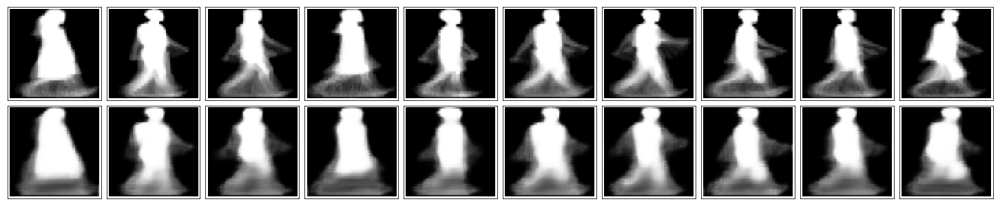

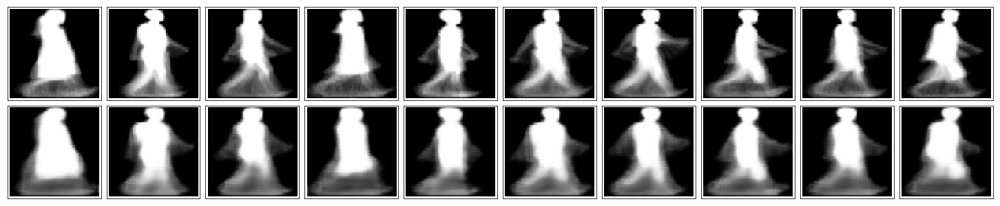

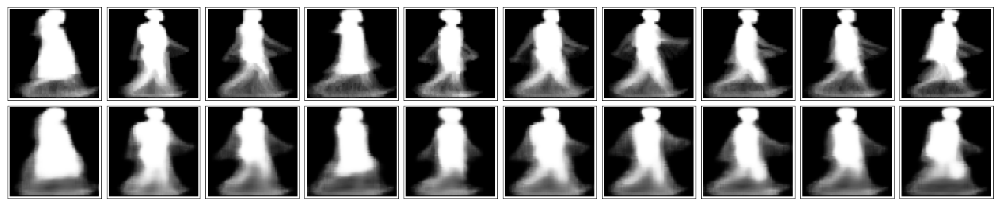

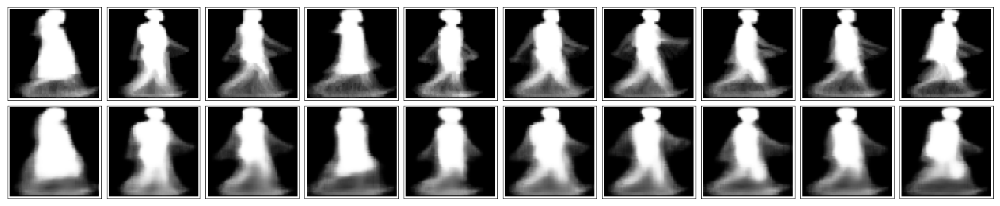

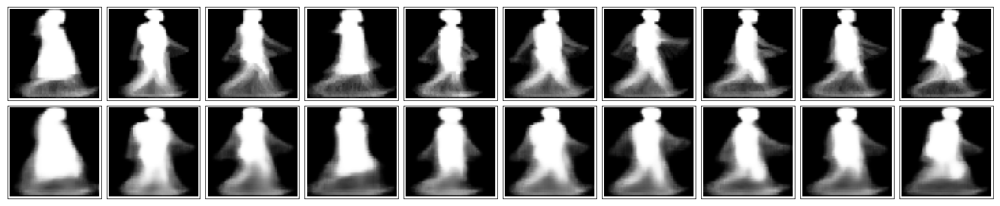

...

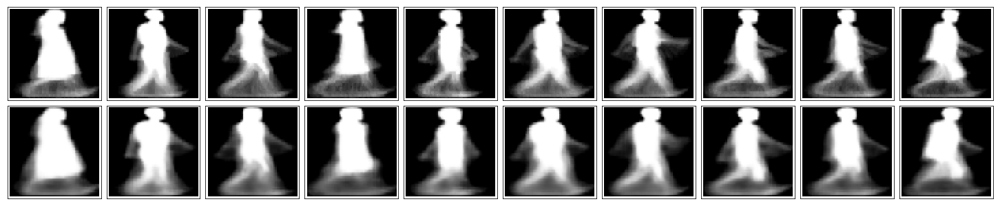

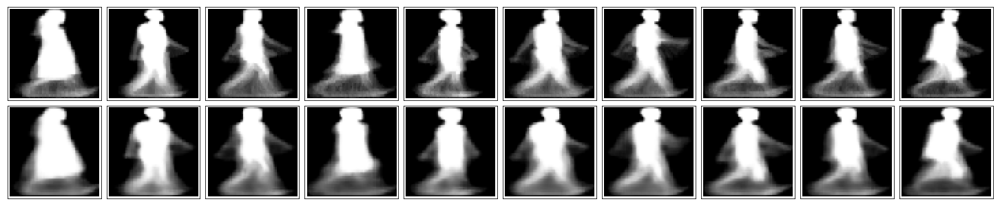

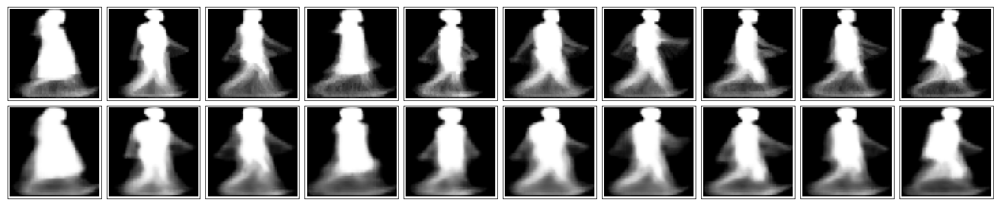

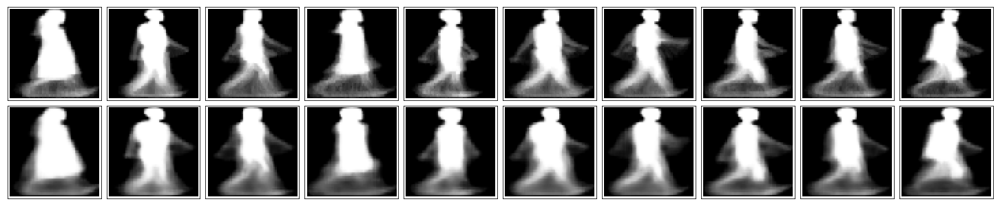

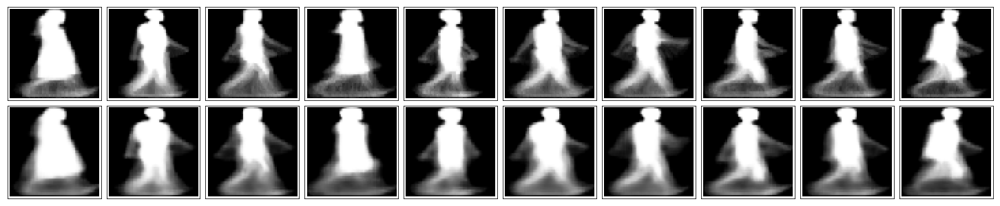

In [11]:
!mkdir checkpoints_view_invariant

Au = 1
training = True
num_layers = 4
epochs = 1800
batch_size = 80
conv_kern_size = (2,2)
conv_strides = (1,1)
pool_size = (2,2)
pool_strides = (2,2)
up_size = [(8,8), (16,16), (32,32), (64,64)]
de_kern_size = (2,2)
de_conv_strides = (1,1)
out_kern_size = (2,2)
out_strides = (1,1)

for lr in [0.001]:
#                 log_string = 'logs/4/lr={},nl={},ls={},bs={}'.format(lr, num_layers, lstm_size, batch_size)
    save_string = './checkpoints_view_invariant/Au={}_lr={}_nl={}_bs={}.ckpt'.format(Au, lr, num_layers, batch_size)
                
#             writer = tf.summary.FileWriter(log_string)
                                
    model = build_graph(conv_kern_size, conv_strides, pool_size, pool_strides, de_kern_size, de_conv_strides,
                        out_kern_size, out_strides, up_size=up_size, is_training=training)

    train(model, epochs, save_string)
                
    print(' ')
    print(' ')
    print("leraning_rate={},num_layers={},batch_size={} finished, saved".format(lr, num_layers, batch_size))
    print(' ')
    print(' ')

<br><br><br><br><br><br><br><br><br>

## Network Architecture

The encoder part of the network will be a typical convolutional pyramid. Each convolutional layer will be followed by a max-pooling layer to reduce the dimensions of the layers. The decoder though might be something new to you. The decoder needs to convert from a narrow representation to a wide reconstructed image. For example, the representation could be a 4x4x8 max-pool layer. This is the output of the encoder, but also the input to the decoder. We want to get a 28x28x1 image out from the decoder so we need to work our way back up from the narrow decoder input layer. A schematic of the network is shown below.

<img src='assets/convolutional_autoencoder.png' width=500px>

Here our final encoder layer has size 4x4x8 = 128. The original images have size 28x28 = 784, so the encoded vector is roughly 16% the size of the original image. These are just suggested sizes for each of the layers. Feel free to change the depths and sizes, but remember our goal here is to find a small representation of the input data.

### What's going on with the decoder

Okay, so the decoder has these "Upsample" layers that you might not have seen before. First off, I'll discuss a bit what these layers *aren't*. Usually, you'll see **transposed convolution** layers used to increase the width and height of the layers. They work almost exactly the same as convolutional layers, but in reverse. A stride in the input layer results in a larger stride in the transposed convolution layer. For example, if you have a 3x3 kernel, a 3x3 patch in the input layer will be reduced to one unit in a convolutional layer. Comparatively, one unit in the input layer will be expanded to a 3x3 path in a transposed convolution layer. The TensorFlow API provides us with an easy way to create the layers, [`tf.nn.conv2d_transpose`](https://www.tensorflow.org/api_docs/python/tf/nn/conv2d_transpose). 

However, transposed convolution layers can lead to artifacts in the final images, such as checkerboard patterns. This is due to overlap in the kernels which can be avoided by setting the stride and kernel size equal. In [this Distill article](http://distill.pub/2016/deconv-checkerboard/) from Augustus Odena, *et al*, the authors show that these checkerboard artifacts can be avoided by resizing the layers using nearest neighbor or bilinear interpolation (upsampling) followed by a convolutional layer. In TensorFlow, this is easily done with [`tf.image.resize_images`](https://www.tensorflow.org/versions/r1.1/api_docs/python/tf/image/resize_images), followed by a convolution. Be sure to read the Distill article to get a better understanding of deconvolutional layers and why we're using upsampling.

> **Exercise:** Build the network shown above. Remember that a convolutional layer with strides of 1 and 'same' padding won't reduce the height and width. That is, if the input is 28x28 and the convolution layer has stride = 1 and 'same' padding, the convolutional layer will also be 28x28. The max-pool layers are used the reduce the width and height. A stride of 2 will reduce the size by 2. Odena *et al* claim that nearest neighbor interpolation works best for the upsampling, so make sure to include that as a parameter in `tf.image.resize_images` or use [`tf.image.resize_nearest_neighbor`]( `https://www.tensorflow.org/api_docs/python/tf/image/resize_nearest_neighbor). For convolutional layers, use [`tf.layers.conv2d`](https://www.tensorflow.org/api_docs/python/tf/layers/conv2d). For example, you would write `conv1 = tf.layers.conv2d(inputs, 32, (5,5), padding='same', activation=tf.nn.relu)` for a layer with a depth of 32, a 5x5 kernel, stride of (1,1), padding is 'same', and a ReLU activation. Similarly, for the max-pool layers, use [`tf.layers.max_pooling2d`](https://www.tensorflow.org/api_docs/python/tf/layers/max_pooling2d).

## Training

As before, here wi'll train the network. Instead of flattening the images though, we can pass them in as 28x28x1 arrays.

In [6]:
sess = tf.Session()

In [ ]:
epochs = 20
batch_size = 200
sess.run(tf.global_variables_initializer())
for e in range(epochs):
    for ii in range(mnist.train.num_examples//batch_size):
        batch = mnist.train.next_batch(batch_size)
        imgs = batch[0].reshape((-1, 28, 28, 1))
        batch_cost, _ = sess.run([cost, opt], feed_dict={inputs_: imgs,
                                                         targets_: imgs})

        print("Epoch: {}/{}...".format(e+1, epochs),
              "Training loss: {:.4f}".format(batch_cost))

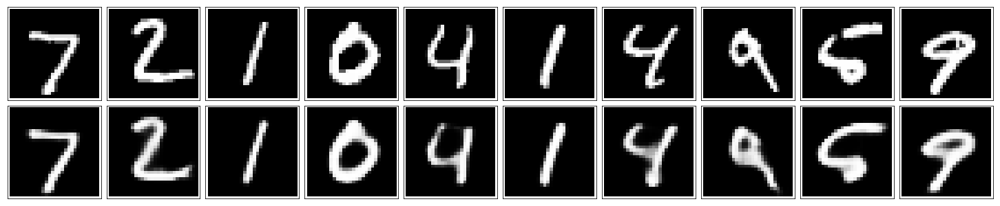

In [13]:
fig, axes = plt.subplots(nrows=2, ncols=10, sharex=True, sharey=True, figsize=(20,4))
in_imgs = mnist.test.images[:10]
reconstructed = sess.run(decoded, feed_dict={inputs_: in_imgs.reshape((10, 28, 28, 1))})

for images, row in zip([in_imgs, reconstructed], axes):
    for img, ax in zip(images, row):
        ax.imshow(img.reshape((28, 28)), cmap='Greys_r')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)


fig.tight_layout(pad=0.1)

In [19]:
sess.close()

## Denoising

As I've mentioned before, autoencoders like the ones you've built so far aren't too useful in practive. However, they can be used to denoise images quite successfully just by training the network on noisy images. We can create the noisy images ourselves by adding Gaussian noise to the training images, then clipping the values to be between 0 and 1. We'll use noisy images as input and the original, clean images as targets. Here's an example of the noisy images I generated and the denoised images.

![Denoising autoencoder](assets/denoising.png)


Since this is a harder problem for the network, we'll want to use deeper convolutional layers here, more feature maps. I suggest something like 32-32-16 for the depths of the convolutional layers in the encoder, and the same depths going backward through the decoder. Otherwise the architecture is the same as before.

> **Exercise:** Build the network for the denoising autoencoder. It's the same as before, but with deeper layers. I suggest 32-32-16 for the depths, but you can play with these numbers, or add more layers.

In [21]:
inputs_ = tf.placeholder(tf.float32, (None, 28, 28, 1), name='inputs')
targets_ = tf.placeholder(tf.float32, (None, 28, 28, 1), name='targets')

### Encoder
conv1 = tf.layers.conv2d(inputs_, 32, (3,3), padding='same', activation=tf.nn.relu)
# Now 28x28x32
maxpool1 = tf.layers.max_pooling2d(conv1, (2,2), (2,2), padding='same')
# Now 14x14x32
conv2 = tf.layers.conv2d(maxpool1, 32, (3,3), padding='same', activation=tf.nn.relu)
# Now 14x14x32
maxpool2 = tf.layers.max_pooling2d(conv2, (2,2), (2,2), padding='same')
# Now 7x7x32
conv3 = tf.layers.conv2d(maxpool2, 16, (3,3), padding='same', activation=tf.nn.relu)
# Now 7x7x16
encoded = tf.layers.max_pooling2d(conv3, (2,2), (2,2), padding='same')
# Now 4x4x16

### Decoder
upsample1 = tf.image.resize_nearest_neighbor(encoded, (7,7))
# Now 7x7x16
conv4 = tf.layers.conv2d(upsample1, 16, (3,3), padding='same', activation=tf.nn.relu)
# Now 7x7x16
upsample2 = tf.image.resize_nearest_neighbor(conv4, (14,14))
# Now 14x14x16
conv5 = tf.layers.conv2d(upsample2, 32, (3,3), padding='same', activation=tf.nn.relu)
# Now 14x14x32
upsample3 = tf.image.resize_nearest_neighbor(conv5, (28,28))
# Now 28x28x32
conv6 = tf.layers.conv2d(upsample3, 32, (3,3), padding='same', activation=tf.nn.relu)
# Now 28x28x32

logits = tf.layers.conv2d(conv6, 1, (3,3), padding='same', activation=None)
#Now 28x28x1

decoded = tf.nn.sigmoid(logits, name='decoded')

loss = tf.nn.sigmoid_cross_entropy_with_logits(labels=targets_, logits=logits)
cost = tf.reduce_mean(loss)
opt = tf.train.AdamOptimizer(0.001).minimize(cost)

In [22]:
sess = tf.Session()

In [ ]:
epochs = 100
batch_size = 200
# Set's how much noise we're adding to the MNIST images
noise_factor = 0.5
sess.run(tf.global_variables_initializer())
for e in range(epochs):
    for ii in range(mnist.train.num_examples//batch_size):
        batch = mnist.train.next_batch(batch_size)
        # Get images from the batch
        imgs = batch[0].reshape((-1, 28, 28, 1))
        
        # Add random noise to the input images
        noisy_imgs = imgs + noise_factor * np.random.randn(*imgs.shape)
        # Clip the images to be between 0 and 1
        noisy_imgs = np.clip(noisy_imgs, 0., 1.)
        
        # Noisy images as inputs, original images as targets
        batch_cost, _ = sess.run([cost, opt], feed_dict={inputs_: noisy_imgs,
                                                         targets_: imgs})

        print("Epoch: {}/{}...".format(e+1, epochs),
              "Training loss: {:.4f}".format(batch_cost))

## Checking out the performance

Here I'm adding noise to the test images and passing them through the autoencoder. It does a suprising great job of removing the noise, even though it's sometimes difficult to tell what the original number is.

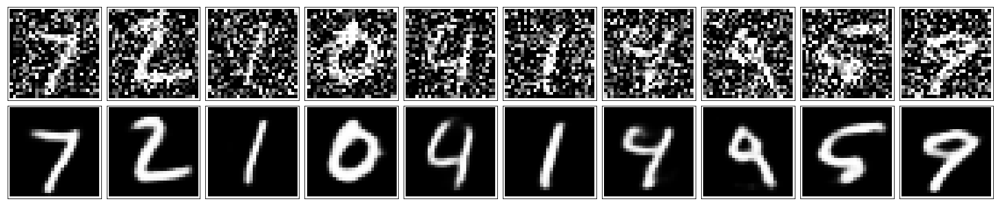

In [29]:
fig, axes = plt.subplots(nrows=2, ncols=10, sharex=True, sharey=True, figsize=(20,4))
in_imgs = mnist.test.images[:10]
noisy_imgs = in_imgs + noise_factor * np.random.randn(*in_imgs.shape)
noisy_imgs = np.clip(noisy_imgs, 0., 1.)

reconstructed = sess.run(decoded, feed_dict={inputs_: noisy_imgs.reshape((10, 28, 28, 1))})

for images, row in zip([noisy_imgs, reconstructed], axes):
    for img, ax in zip(images, row):
        ax.imshow(img.reshape((28, 28)), cmap='Greys_r')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

fig.tight_layout(pad=0.1)